# Practico de Aprendizaje No supervisado #

Grupo 18 - Integrantes:

*   Bergamasco Paula
*   Correa Francisco
*   Chiapello Nicolas


## 1 -Carga de datos

In [1]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns',1000)
pd.set_option('display.max_rows',1000)
import itertools
import warnings
warnings.filterwarnings("ignore")
import io

In [2]:
from plotly.offline import init_notebook_mode, plot,iplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)
import matplotlib.pyplot as plt
import plotly.tools as tls
import plotly.figure_factory as ff
import seaborn as sns

In [3]:
! git clone https://github.com/PaulaBergamasco/Random

fatal: destination path 'Random' already exists and is not an empty directory.


In [4]:
df=pd.read_csv("/content/Random/players_21.csv")
df.head(2)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club_name,league_name,league_rank,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,33,1987-06-24,170,72,Argentina,FC Barcelona,Spain Primera Division,1.0,93,93,67500000,560000,"RW, ST, CF",Left,5,4,4,Medium/Low,Messi,Yes,138400000.0,"#Dribbler, #Distance Shooter, #FK Specialist, ...",CAM,10.0,NaN,2004-07-01,2021.0,RW,10.0,85.0,92.0,91.0,95.0,38.0,65.0,NaN,NaN,NaN,NaN,NaN,NaN,"Finesse Shot, Long Shot Taker (AI), Speed Drib...",85,95,70,91,88,96,93,94,91,96,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,NaN,35,24,6,11,15,14,8,89+3,89+3,89+3,92+0,93+0,93+0,93+0,92+0,93+0,93+0,93+0,91+2,87+3,87+3,87+3,91+2,66+3,65+3,65+3,65+3,66+3,62+3,52+3,52+3,52+3,62+3
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,35,1985-02-05,187,83,Portugal,Juventus,Italian Serie A,1.0,92,92,46000000,220000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,75900000.0,"#Aerial Threat, #Dribbler, #Distance Shooter, ...",LS,7.0,NaN,2018-07-10,2022.0,LS,7.0,89.0,93.0,81.0,89.0,35.0,77.0,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Flair, Long Shot Taker (AI), ...",84,95,90,82,86,88,81,76,77,92,87,91,87,95,71,94,95,84,78,93,63,29,95,82,84,95,NaN,32,24,7,11,15,14,11,91+1,91+1,91+1,89+0,91+0,91+0,91+0,89+0,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,54+3,54+3,54+3,61+3


In [5]:
print(df.columns)
print(len(df.columns))

Index(['sofifa_id', 'player_url', 'short_name', 'long_name', 'age', 'dob',
       'height_cm', 'weight_kg', 'nationality', 'club_name',
       ...
       'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb'],
      dtype='object', length=106)
106


## 2- Exploracion de los datos


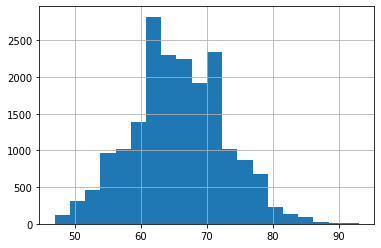

In [6]:
#histograma de variable overall 
df['overall'].hist(bins = 20)


In [7]:
#10 jugadores con mayor overall
best_players_per_position=df.iloc[df.groupby(df['team_position'])['overall'].idxmax()][['team_position','short_name','overall']]
best_players_per_position.sort_values('overall', ascending=False)[:10]

,team_position,short_name,overall
0,CAM,L. Messi,93
1,LS,Cristiano Ronaldo,92
2,GK,J. Oblak,91
3,ST,R. Lewandowski,91
5,RCM,K. De Bruyne,91
4,LW,Neymar Jr,91
8,LCB,V. van Dijk,90
11,RW,M. Salah,90
13,SUB,S. Agüero,89
17,CDM,Casemiro,89


In [8]:
#cantidad de jugadores por posición
pd.DataFrame(df.team_position.value_counts().sort_values(ascending=False)[:10])

,team_position
SUB,8065
RES,3163
LCB,681
GK,681
RCB,681
RB,553
LB,553
ST,452
RCM,425
LCM,425


Las posiciones 'SUB' y 'RES' se corresponden a suplentes y reservas.

In [9]:
#10 clubes con mayor overall promedio  
club_avg_overall=df.groupby("club_name")["overall"].mean().round(0).reset_index().sort_values("overall",ascending=False)
club_avg_overall.head(10)

,club_name,overall
216,FC Bayern München,81.0
131,Chelsea,79.0
374,Liverpool,79.0
214,FC Barcelona,79.0
489,Real Madrid,79.0
387,Manchester United,78.0
330,Inter,78.0
451,Paris Saint-Germain,77.0
612,Tottenham Hotspur,77.0
386,Manchester City,77.0


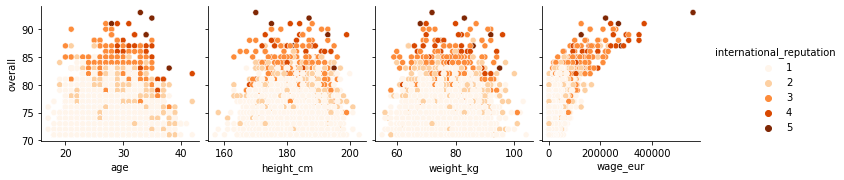

In [10]:
#caracteristicas del jugador relacionadad a la variable overall 
#la edad de los jugadores con mayor overall ronda a edades cercanas a los 30 anos 
#como se espera los jugadores con mejor overall tienen mayores ganancias
#tambien se puede ver en todos los casos que a mayor overall mayor es la reputacion internacional del jugador
sns.pairplot(
    df[df.overall > 70],
    x_vars=['age', 'height_cm',	'weight_kg', 'wage_eur'],
    y_vars=["overall"],
    hue= 'international_reputation',
    palette='Oranges')


## 3- Limpieza y Curacion de datos

In [11]:
df['overall'].quantile(0.75)

70.0

In [12]:
#Se seleccionan aquellos jugadores que poseen un overall superior a 70, es decir aquellos jugadores que superan el tercer cuantil
df_f =df[df.overall > 70]
df_f.shape

(4512, 106)

In [13]:
df_f.team_position.value_counts().sort_values(ascending=False)

SUB    1448
GK      293
RES     241
RCB     219
RB      214
LCB     213
LB      184
ST      174
RM      155
LCM     153
LM      151
RCM     140
CAM     128
RDM      97
LDM      97
LS       85
RS       78
CDM      72
RW       71
LW       70
CB       41
RWB      19
CM       19
LWB      15
LAM      12
RAM      11
CF        8
LF        8
RF        7
Name: team_position, dtype: int64

In [14]:
#se quitaron las skills repetidas
skills_ratings = ['attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing',
       'attacking_volleys', 'skill_dribbling', 'skill_curve',
       'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control',
       'movement_acceleration', 'movement_sprint_speed', 'movement_agility',
       'movement_reactions', 'movement_balance', 'power_shot_power',
       'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots',
       'mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision', 'mentality_penalties',
       'mentality_composure', 'defending_standing_tackle',
       'defending_sliding_tackle', 'goalkeeping_diving',
       'goalkeeping_handling', 'goalkeeping_kicking',
       'goalkeeping_positioning', 'goalkeeping_reflexes']
print(len(skills_ratings))

33


In [15]:
#dataset que contiene solo las características futbolísticas del jugador
df_s=df_f[skills_ratings]
df_s.head(2)

,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
0,85,95,70,91,88,96,93,94,91,96,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,35,24,6,11,15,14,8
1,84,95,90,82,86,88,81,76,77,92,87,91,87,95,71,94,95,84,78,93,63,29,95,82,84,95,32,24,7,11,15,14,11


In [16]:
df_f.team_position.unique()

array(['CAM', 'LS', 'GK', 'ST', 'LW', 'RCM', 'LCB', 'RW', 'SUB', 'CF',
       'CDM', 'RDM', 'RS', 'LCM', 'RB', 'LB', 'LM', 'RCB', 'LF', 'CB',
       'RM', 'LDM', 'RF', 'RES', 'LWB', 'CM', nan, 'LAM', 'RWB', 'RAM'],
      dtype=object)

In [17]:
# Se crea una variable que agrupa las posiciones de los jugadores en cuatro posiciones generales: 
# arqueros, defensores, mediocampistas, y delanteros
new_position = {
      'RCB':'Defensores', 'CB':'Defensores', 'LCB':'Defensores', 'LB':'Defensores', 'RB':'Defensores', 'RWB':'Defensores', 'LWB':'Defensores', 
      'CM':'Mediocampistas', 'CDM':'Mediocampistas', 'CAM':'Mediocampistas', 'RCM':'Mediocampistas', 'RDM':'Mediocampistas', 'LCM':'Mediocampistas', 'LDM':'Mediocampistas', 'LAM':'Mediocampistas', 'RAM':'Mediocampistas',  'RM':'Mediocampistas', 'LM':'Mediocampistas',
      'ST':'Delanteros', 'RF':'Delanteros', 'LW':'Delanteros', 'RS':'Delanteros', 'RW':'Delanteros', 'CF':'Delanteros', 'LS':'Delanteros', 'LF':'Delanteros', 
      'GK':'Arqueros'}

position = df_f.team_position.replace(new_position)
df_f['new_position'] = position
df_f.head(2)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club_name,league_name,league_rank,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,new_position
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,33,1987-06-24,170,72,Argentina,FC Barcelona,Spain Primera Division,1.0,93,93,67500000,560000,"RW, ST, CF",Left,5,4,4,Medium/Low,Messi,Yes,138400000.0,"#Dribbler, #Distance Shooter, #FK Specialist, ...",CAM,10.0,NaN,2004-07-01,2021.0,RW,10.0,85.0,92.0,91.0,95.0,38.0,65.0,NaN,NaN,NaN,NaN,NaN,NaN,"Finesse Shot, Long Shot Taker (AI), Speed Drib...",85,95,70,91,88,96,93,94,91,96,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,NaN,35,24,6,11,15,14,8,89+3,89+3,89+3,92+0,93+0,93+0,93+0,92+0,93+0,93+0,93+0,91+2,87+3,87+3,87+3,91+2,66+3,65+3,65+3,65+3,66+3,62+3,52+3,52+3,52+3,62+3,Mediocampistas
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,35,1985-02-05,187,83,Portugal,Juventus,Italian Serie A,1.0,92,92,46000000,220000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,75900000.0,"#Aerial Threat, #Dribbler, #Distance Shooter, ...",LS,7.0,NaN,2018-07-10,2022.0,LS,7.0,89.0,93.0,81.0,89.0,35.0,77.0,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Flair, Long Shot Taker (AI), ...",84,95,90,82,86,88,81,76,77,92,87,91,87,95,71,94,95,84,78,93,63,29,95,82,84,95,NaN,32,24,7,11,15,14,11,91+1,91+1,91+1,89+0,91+0,91+0,91+0,89+0,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,54+3,54+3,54+3,61+3,Delanteros


In [18]:
df_f.shape

(4512, 107)

## 4- Analisis de a dos variables

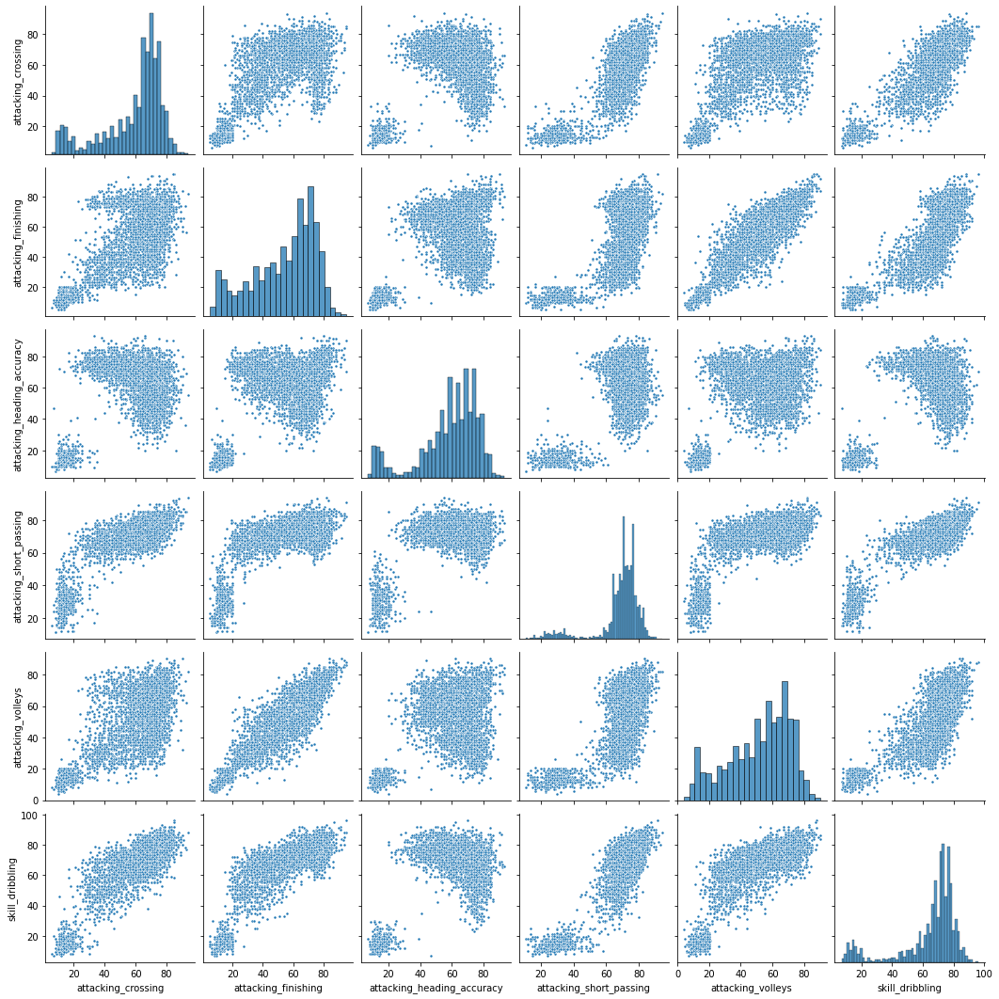

In [19]:
sns.pairplot(df_s.iloc[:,:6], markers= '.')

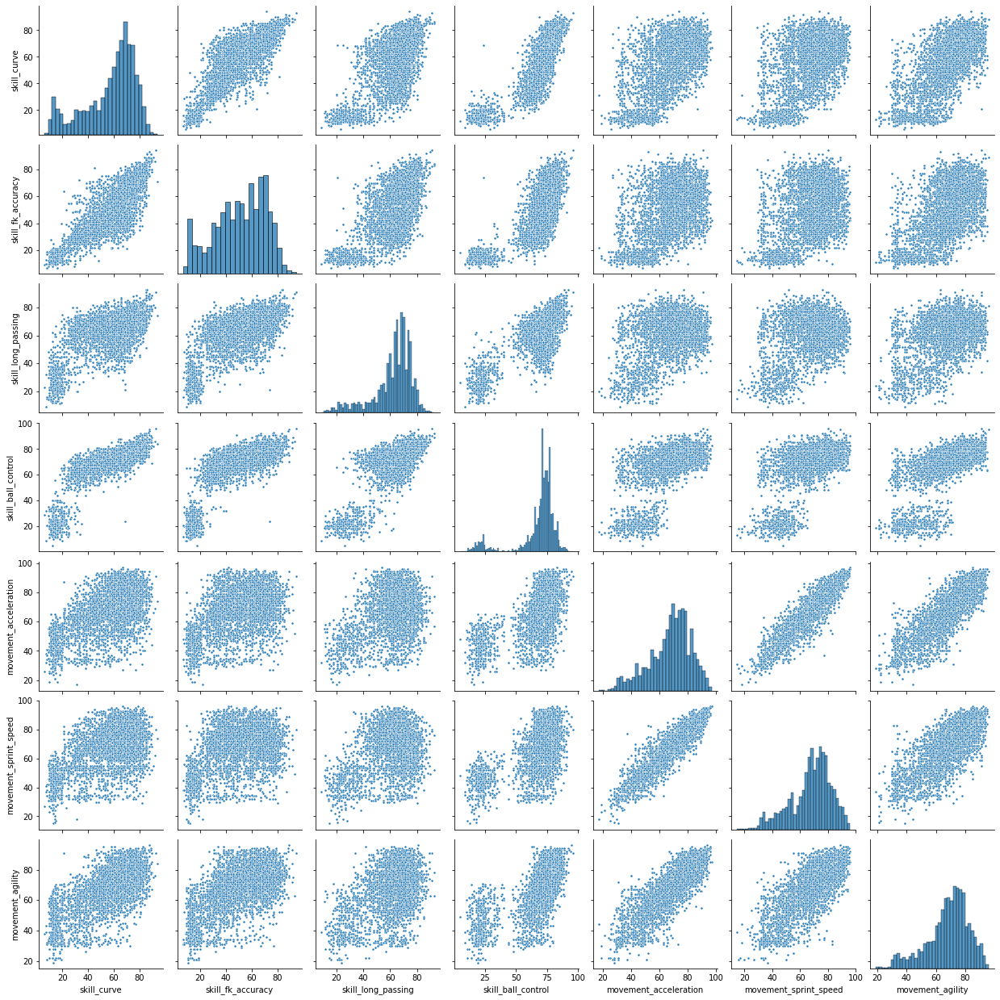

In [20]:
sns.pairplot(df_s.iloc[:,6:13], markers= '.')

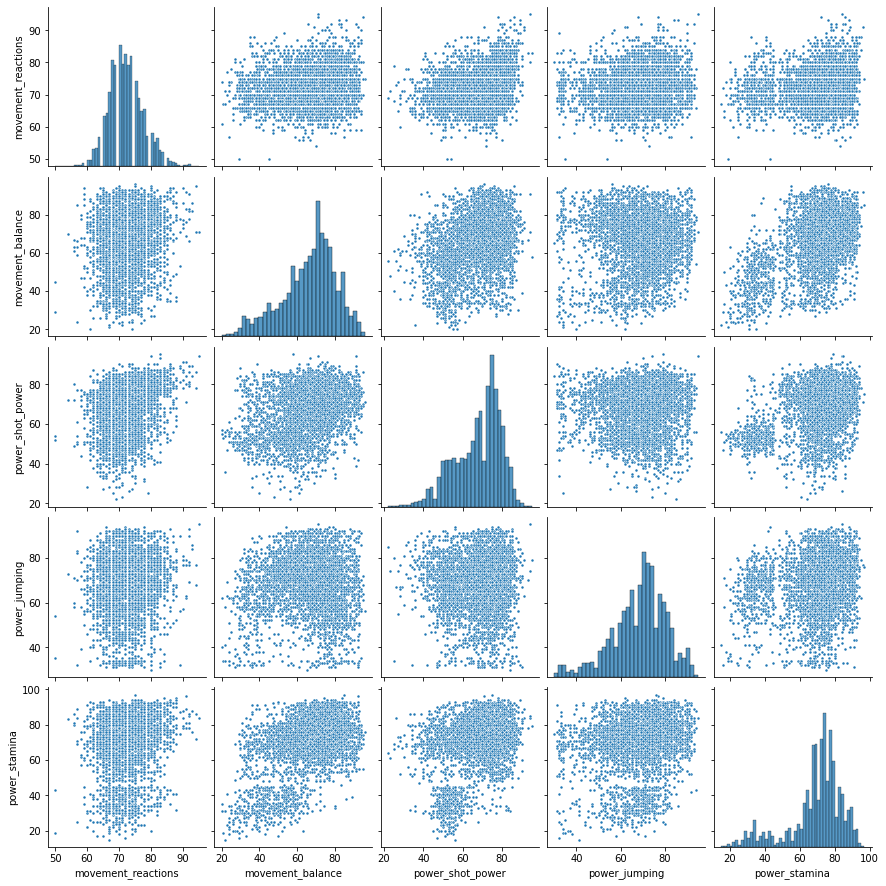

In [21]:
sns.pairplot(df_s.iloc[:,13:18], markers= '.')

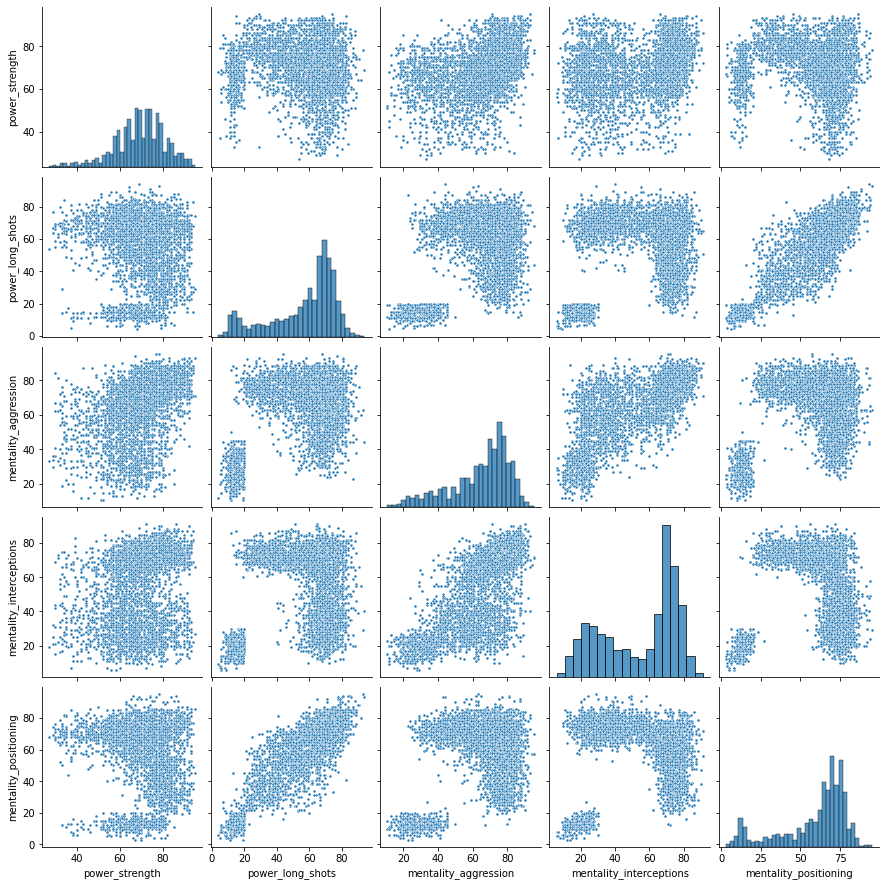

In [22]:
sns.pairplot(df_s.iloc[:,18:23], markers= '.')

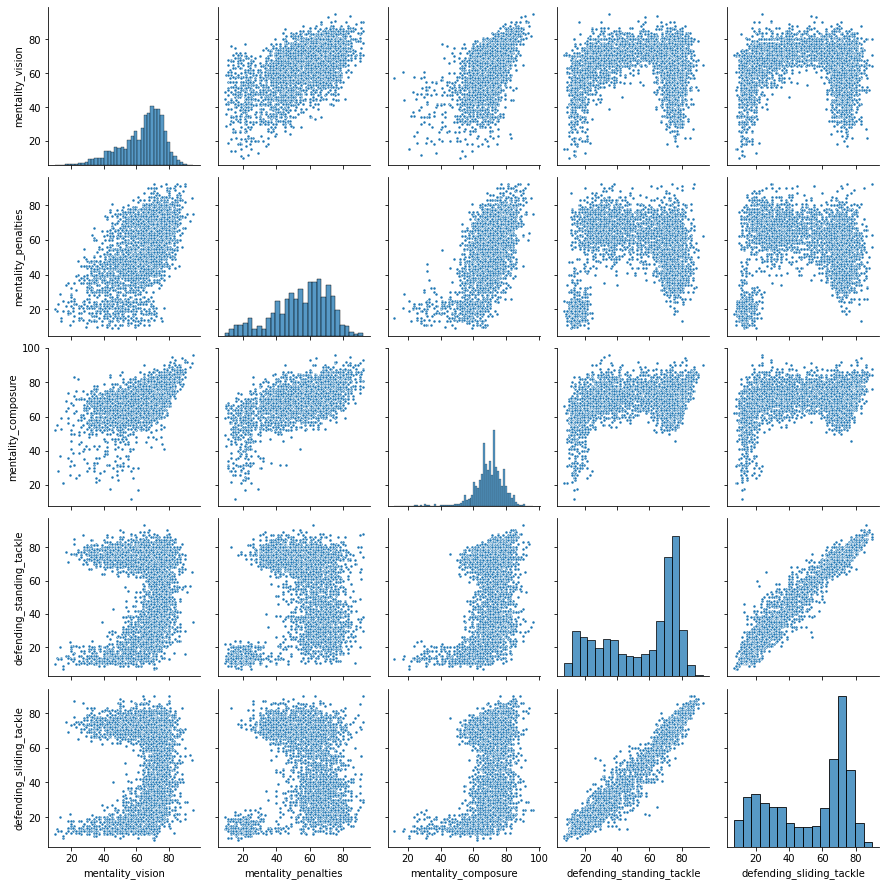

In [23]:
sns.pairplot(df_s.iloc[:,23:28], markers= '.')

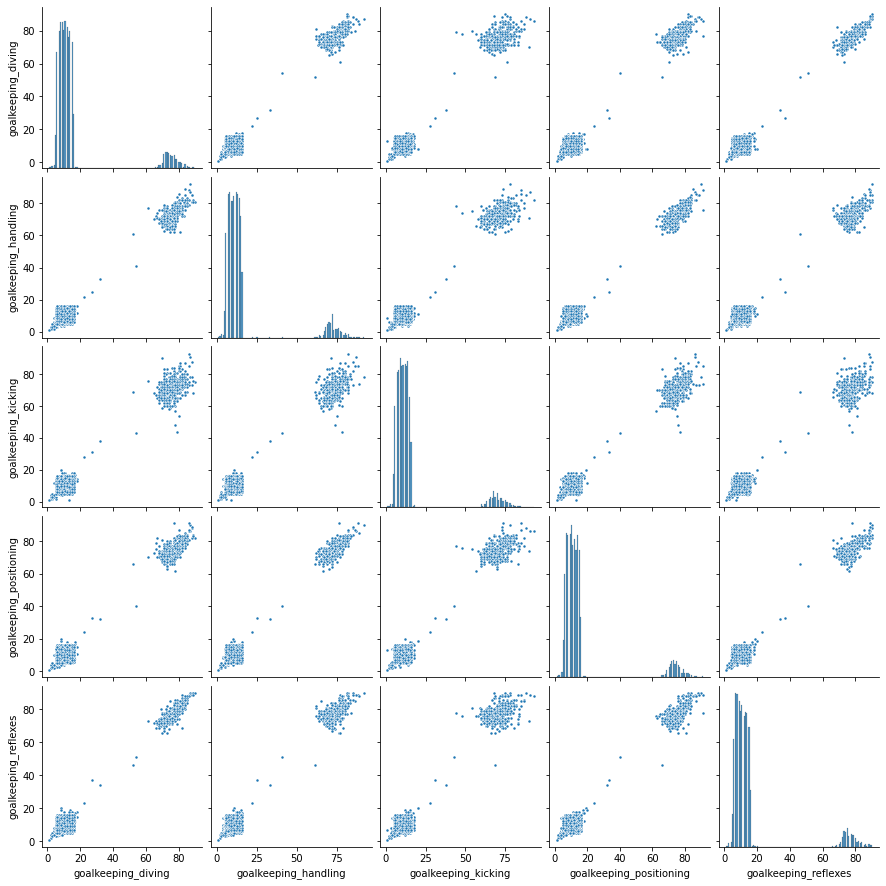

In [24]:
sns.pairplot(df_s.iloc[:,28:33], markers= '.')

In [25]:
df_f['new_position'].unique()

array(['Mediocampistas', 'Delanteros', 'Arqueros', 'Defensores', 'SUB',
       'RES', nan], dtype=object)

In [26]:
# Se grafican las variables sin tener en cuenta la categoria 'SUB' y 'RES', 
# sin las filas que no contienen posicion de jugador, y eliminando los arqueros, observandose una mejor separacion de los datos,
# se diferencia posiciones con colores.

df_position=df_f[(df_f.team_position!='SUB')&(df_f.team_position!='RES')&((-df_f.team_position.isna())&(df_f.team_position!='GK'))].copy()


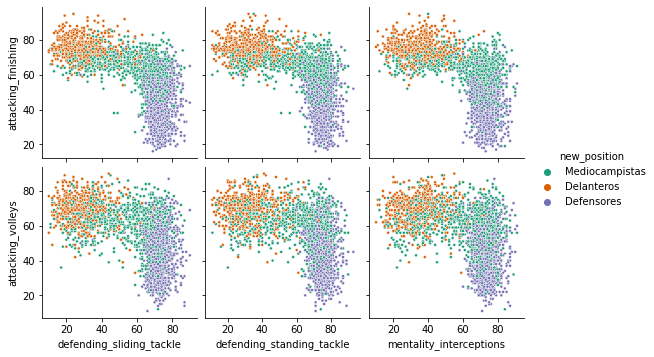

In [27]:
sns.pairplot(
    df_position,
    x_vars=['defending_sliding_tackle','defending_standing_tackle','mentality_interceptions'],
    y_vars=['attacking_finishing','attacking_volleys'],
    hue= 'new_position',
    palette='Dark2',
    markers= '.')

## 5- Agrupamientos sobre espacio original

### 5-1- Kmeans

In [28]:
# Se realiza clustering sin tener en cuenta las categorias 'SUB' y 'RES' y sin las filas que no contienen posicion de jugador,
# ya que se observaba mejor diferenciación de las posiciones sin ellas.
df_position['new_position'].value_counts()

Mediocampistas    1035
Defensores         905
Delanteros         501
Name: new_position, dtype: int64

In [29]:
#se eliminan las skills de los arqueros
skills_ratings_sin_arqueros = [ 'attacking_crossing', 'attacking_finishing',
       'attacking_heading_accuracy', 'attacking_short_passing',
       'attacking_volleys', 'skill_dribbling', 'skill_curve',
       'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control',
       'movement_acceleration', 'movement_sprint_speed', 'movement_agility',
       'movement_reactions', 'movement_balance', 'power_shot_power',
       'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots',
       'mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision', 'mentality_penalties',
       'mentality_composure', 'defending_standing_tackle',
       'defending_sliding_tackle']

In [30]:
df_position.shape

(2441, 107)

In [31]:
#dataset con solo las variables numericas
df_n=df_position[skills_ratings_sin_arqueros].copy()
df_n.shape

(2441, 28)

Text(0.5, 1.0, 'Inertia of k-Means versus number of clusters')

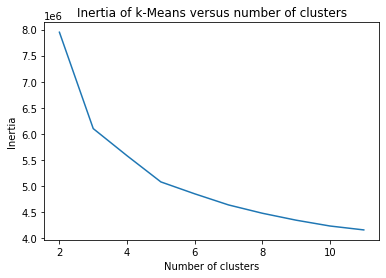

In [32]:
#se emplea el método del codo para determinar el número de clusters más adecuado 
from sklearn.cluster import KMeans,MeanShift
scores = [KMeans(n_clusters=i).fit(df_n).inertia_ for i in range(2,12)]

plt.plot(np.arange(2, 12), scores)
plt.xlabel('Number of clusters')
plt.ylabel("Inertia")
plt.title("Inertia of k-Means versus number of clusters")

In [33]:
# Se determina el cinco como el número más adecuado de clusters
n_clust = 5

km = KMeans(n_clusters=n_clust, random_state=1)
km.fit(df_n) 

clusters = km.labels_

In [34]:
kmean_clusters_1 = go.Scatter(x= df_n['defending_sliding_tackle'], y=df_n['attacking_finishing'],
                           mode='markers',
                        text=df_position.loc[:,'new_position'],
                           marker=dict(
                                size=5,
                                color = clusters.astype(np.float), 
                                colorscale='cividis',
                                showscale=False))


layout_1 = go.Layout(title="Clustering K means ",titlefont=dict(size=20),
                xaxis=dict(title='defending_sliding_tackle'),
                yaxis=dict(title='attacking_finishing'),
                autosize=False, width=1000,height=650)

fig1 = go.Figure(data=kmean_clusters_1, layout=layout_1)
fig1.show(renderer="colab")

#### Análisis de clusters

In [35]:
df_clusters=df_position.copy()
df_clusters['kmeans'] = km.labels_ 
df_clusters.kmeans.value_counts()

0    640
1    568
2    552
4    390
3    291
Name: kmeans, dtype: int64

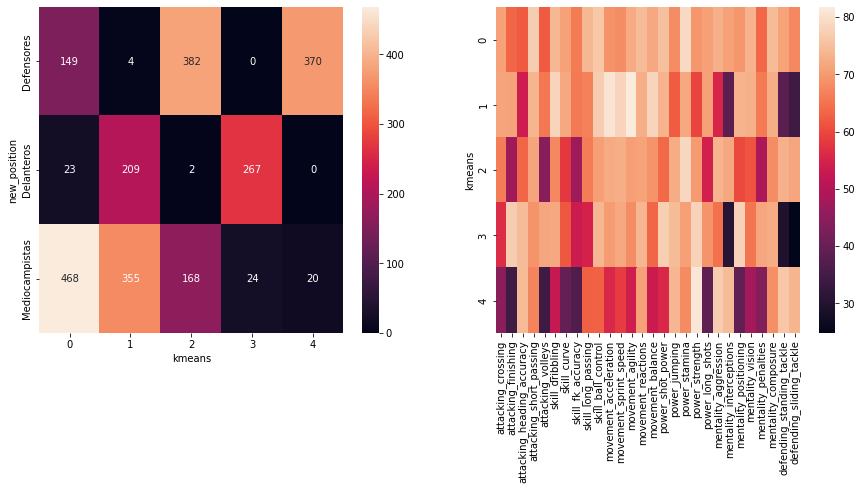

In [36]:
#se grafica las posiciones y se diferencian por clusters y se comparan clusters con todas las dimensiones de atributos
fig,axes = plt.subplots(nrows=1,ncols=2,figsize=(15,6))
#ax = plt.subplots(nrows=1,ncols=2)
sns.heatmap(pd.crosstab(df_clusters['new_position'],df_clusters['kmeans']),annot=True,fmt='g',ax=axes[0])
sns.heatmap(df_clusters.groupby(['kmeans'])[skills_ratings_sin_arqueros].mean(),ax=axes[1])

Observando las visualizaciones podemos ver las agrupaciones realizadas por kmeans, dos grupos con menores atributos de defensa, compuesto por mediocampistas y delanteros, grupos con mas habilidades de defensa y menos de ataque, un grupo de delanteros con mayor velocidad y aceleracion y otro grupo con mayor punteria, definicion, entre otras.

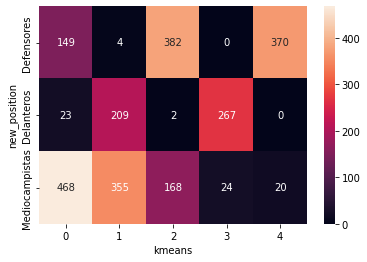

In [37]:
sns.heatmap(pd.crosstab(df_clusters['new_position'],df_clusters['kmeans']),annot=True,fmt='g')

Se puede observar que hay una cierta concordancia en la división de clusters y las posiciones, ya que los cluster 0, 2, y 4 estan conformados principalmente por defensores y los clusters 1 y 3 estan conformados principalmente por delanteros. La posición de mediocampista se entrecruza con los clusters correspondientes a delanteros, y defensores. Esto puede deberse a que puede que haya mediocampistas con más habilidades de delantero, y mediocampistas con mas habilidades de defensor. 

### 5-2- MEAN SHIFT

In [38]:
from sklearn.cluster import estimate_bandwidth
estimate_bandwidth(df_n)

75.91328339591092

Con el bandwith estimado Mean Shift encuentra un solo agrupamiento, por lo tanto lo disminuimos.

In [39]:
ms = MeanShift(bandwidth=59) 

ms.fit(df_n)

clusters2 = ms.labels_
cluster_centers = ms.cluster_centers_

labels_unique = np.unique(clusters2)
n_clusters_ = len(labels_unique)

print("Cantidad de clusters encontrados por Mean Shift : %d" % n_clusters_)

Cantidad de clusters encontrados por Mean Shift : 3


In [40]:
MeanShift_clusters = go.Scatter(x= df_n['defending_sliding_tackle'], y=df_n['attacking_finishing'],
                           mode='markers',
                        text=df_position.loc[:,'new_position'],
                           marker=dict(
                                size=5,
                                color = clusters2.astype(np.float), 
                                colorscale='geyser',
                                showscale=False)
                           )


layout_3= go.Layout(title="Mean Shift",titlefont=dict(size=20),
                xaxis=dict(title='defending_sliding_tackle'),
                yaxis=dict(title='mentality_interceptions'),
                autosize=False, width=1000,height=650)

fig3 = go.Figure(data=MeanShift_clusters, layout=layout_3)
fig3.show(renderer="colab")

#### Análisis de clusters

In [41]:
df_clusters['MeanS'] =  ms.labels_ 
df_clusters.MeanS.value_counts()

0    2325
2      91
1      25
Name: MeanS, dtype: int64

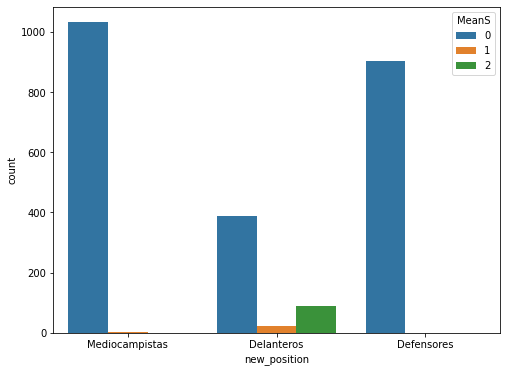

In [42]:
#se grafica las posiciones y se diferencuan por clusters
fig = plt.figure(figsize=(8,6))
sns.countplot(df_clusters['new_position'], hue= df_clusters['MeanS'])

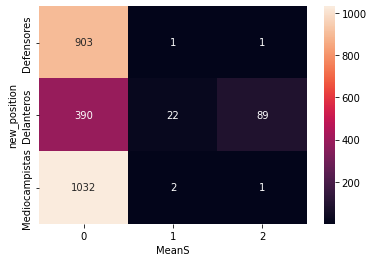

In [43]:
sns.heatmap(pd.crosstab(df_clusters['new_position'],df_clusters['MeanS']),annot=True,fmt='g')

Se puede observar como en el caso anterior, la posición de mediocampista se entrecruza con los clusters correspondientes a defensores y delanteros. 

### 5-3- ALGORITMO JERÁRQUICO

In [44]:
from sklearn import cluster

jerarquico= cluster.AgglomerativeClustering(n_clusters=4, linkage='complete', affinity='cityblock')

jerarquico.fit(df_n)

clusters3 = jerarquico.labels_

In [45]:
jerarquico_clusters = go.Scatter(x= df_n['defending_sliding_tackle'], y=df_n['attacking_finishing'],
                           mode='markers',
                        text=df_position.loc[:,'new_position'],
                           marker=dict(
                                size=5,
                                color = clusters3.astype(np.float), 
                                colorscale='inferno',
                                showscale=False))

layout_6 = go.Layout(title="Clustering jerárquico ",titlefont=dict(size=20),
                xaxis=dict(title='defending_sliding_tackle'),
                yaxis=dict(title='mentality_interceptions'),
                autosize=False, width=1000,height=650)

fig6 = go.Figure(data=jerarquico_clusters, layout=layout_6)
fig6.show(renderer="colab")

#### Análisis de clusters

In [46]:
df_clusters['jerarquico'] = jerarquico.labels_ 
df_clusters.jerarquico.value_counts()

0    842
3    785
1    663
2    151
Name: jerarquico, dtype: int64

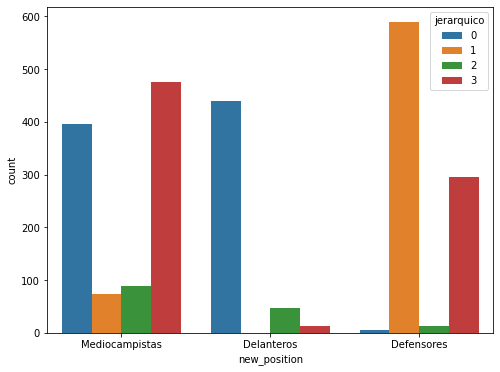

In [47]:
#se grafica las posiciones y se diferencuan por clusters
fig = plt.figure(figsize=(8,6))
sns.countplot(df_clusters['new_position'], hue= df_clusters['jerarquico'])

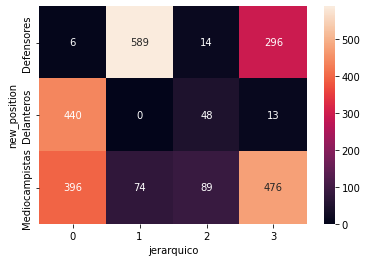

In [48]:
sns.heatmap(pd.crosstab(df_clusters['new_position'],df_clusters['jerarquico']),annot=True,fmt='g')

Se puede observar que como en KMEAN y MEAN SHIFT, hay una cierta concordancia en la división de clusters y las posiciones, si bien la posición de mediocampista se entrecruza con los clusters correspondientes a delanteros, y defensores. Esto puede deberse a que puede que haya mediocampistas con más habilidades de delantero, y mediocampistas con mas habilidades de defensor.

### 5-4- Comparacion agrupamientos

In [49]:
# Funcion graficar silhouettte y dos skills 

from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

def silhouette_coef (df,clusters,metodo, skill_1,skill_2):
    n_clusters_=len(np.unique(clusters))
    # Silhoutte
      # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters
    silhouette_avg2 = silhouette_score(df, clusters)
    print('Metodo Agrupamiento: ', metodo)

    print("Para n_clusters =", n_clusters_,
            "El silhouette_score promedio es :", silhouette_avg2)

    # Compute the silhouette scores for each sample
    sample_silhouette_values2 = silhouette_samples(df, clusters)

    fig, (ax1,ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18,6)
    y_lower = 10
    for i in range(n_clusters_):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values2[clusters == i]
        print('Cluster '+str(i)+' :',ith_cluster_silhouette_values.shape[0])
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters_)
       
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Visualizacion de los datos.")
    #ax1.set_xlabel("espacio de la primera caracteristica")
    #ax1.set_ylabel("espacio de la segunda caracteristica")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg2, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    
    sns.scatterplot(data=df, y=skill_1, x=skill_2,hue=clusters, 
                    palette='Dark2' ,ax=ax2) #
    plt.show()

Metodo Agrupamiento:  kmeans
Para n_clusters = 5 El silhouette_score promedio es : 0.18130472432780403
Cluster 0 : 640
Cluster 1 : 568
Cluster 2 : 552
Cluster 3 : 291
Cluster 4 : 390


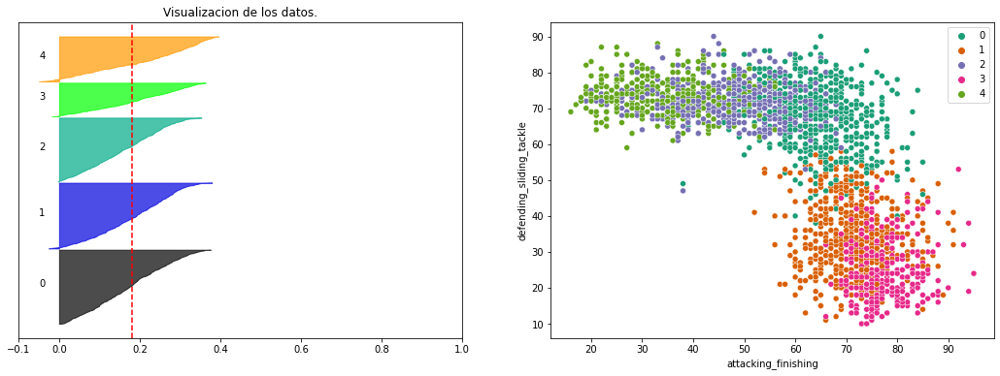

Metodo Agrupamiento:  MeanS
Para n_clusters = 3 El silhouette_score promedio es : 0.14092422999748025
Cluster 0 : 2325
Cluster 1 : 25
Cluster 2 : 91


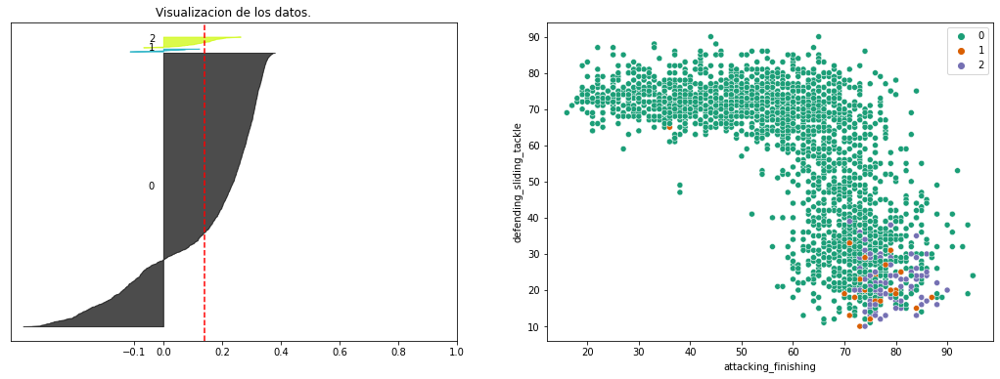

Metodo Agrupamiento:  jerarquico
Para n_clusters = 4 El silhouette_score promedio es : 0.18958403799928272
Cluster 0 : 842
Cluster 1 : 663
Cluster 2 : 151
Cluster 3 : 785


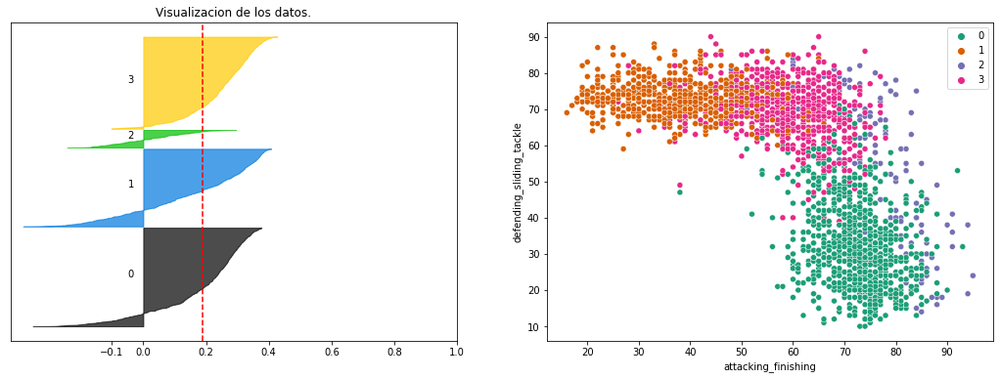

In [50]:
for i in ['kmeans','MeanS','jerarquico']:  
  silhouette_coef (df_n,df_clusters[i].values,i,'defending_sliding_tackle','attacking_finishing')

## 6- Proyeccion utilizando t-SNE

Proyectamos las skills del espacio de 28 dimensiones (sin incluir arqueros) a 2 dimensiones, teniendo en cuenta solo jugadores titulares en equipos, es decir sin suplentes y reservas.

In [51]:
df_position.shape, df_n.shape

((2441, 107), (2441, 28))

In [52]:
from sklearn import (manifold, preprocessing, decomposition)
import time

time_start = time.time()

tsne = manifold.TSNE(n_components=2, verbose=1, perplexity=30)
X_tsne = tsne.fit_transform(df_n)

print ('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2441 samples in 0.001s...
[t-SNE] Computed neighbors for 2441 samples in 0.225s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2441
[t-SNE] Computed conditional probabilities for sample 2000 / 2441
[t-SNE] Computed conditional probabilities for sample 2441 / 2441
[t-SNE] Mean sigma: 15.379774
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.970718
[t-SNE] KL divergence after 1000 iterations: 1.545016
t-SNE done! Time elapsed: 19.75893235206604 seconds


In [53]:
X_tsne.shape

(2441, 2)

In [54]:
graf1 = go.Scatter(x=X_tsne[:,0], y=X_tsne[:,1],
                           mode='markers',
                           text=df_position.loc[:,'new_position'],
                           marker=dict(
                                size=5)
                           )

layout_9 = go.Layout(title="Visualización de la base en el espacio tsne",titlefont=dict(size=20),
                xaxis=dict(title='componente 1'),
                yaxis=dict(title='componente 2'),
                autosize=False, width=800,height=500)

fig9 = go.Figure(data=graf1,layout=layout_9)

fig9.show(renderer="colab")

In [55]:
Delantero= df_position["new_position"] == 'Delanteros'
Defensor= df_position["new_position"] == 'Defensores'
Mediocampista= df_position["new_position"] == 'Mediocampistas'
Arquero= df_position["new_position"] == 'Arqueros'


bool_crack=df_position["overall"] > 85

palette=['navy','red','#A2D5F2','orange','green','pink']  
data=[]

delan =go.Scatter(x=X_tsne[Delantero,0], y=X_tsne[Delantero,1],name='Delantero',
                      text=df_position.loc[Delantero],
                      opacity=0.9,marker=dict(color=palette[0],size=5),mode='markers')

m =go.Scatter(x=X_tsne[Mediocampista,0], y=X_tsne[Mediocampista,1],name='Mediocampista',
                      text=df_position.loc[Mediocampista],
                      opacity=0.6,marker=dict(color=palette[1],size=5),mode='markers')

defen =go.Scatter(x=X_tsne[Defensor,0], y=X_tsne[Defensor,1],name='Defensor',
                      text=df_position.loc[Defensor],
                      opacity=0.7,marker=dict(color=palette[2],size=5),mode='markers')

crack =go.Scatter(x=X_tsne[bool_crack,0], y=X_tsne[bool_crack,1],name='Top player',
                      text=df_position.loc[bool_crack,'short_name'],textfont=dict(family='sans serif',color='black',size=16),
                      opacity=0.9,mode='text')

layout_10 = go.Layout(title="t-SNE - Fifa Players",titlefont=dict(size=20),
                autosize=False, width=1050,height=750)

data=[delan,m,defen,crack]

fig10 = go.Figure(data=data, layout=layout_10)
fig10.show(renderer="colab")

El agrupamiento visual, en este espacio, de los jugadores no es tan evidente pues los clusters no son disconexos. Las posiciones no explican tan claramente los clusters encontrados. Una explicación posible puede ser porque hay jugadores ambivalentes que unen los espacios entre defensa, mediocampo y ataque.


### Agrupamientos sobre t-SNE

Analizamos los metodos de agrupamiento sobre las proyecciones obtenidas sobre t-SNE.

In [56]:
# Dataframe con proyecciones tsne
df_tsne=df_position.copy()
df_tsne[['tsne_1','tsne_2']]= X_tsne[:,:]

In [57]:
df_tsne.shape,X_tsne.shape

((2441, 109), (2441, 2))

#### 6-1- Kmeans

Text(0.5, 1.0, 'Inertia of k-Means versus number of clusters')

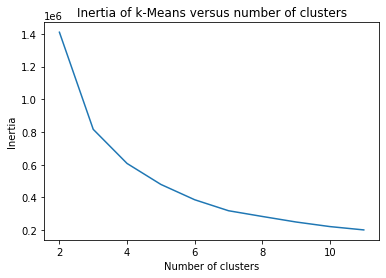

In [58]:
# Se emplea el método del codo para determinar el número de clusters más adecuado 

scores = [KMeans(n_clusters=i).fit(X_tsne).inertia_ for i in range(2,12)]

plt.plot(np.arange(2, 12), scores)
plt.xlabel('Number of clusters')
plt.ylabel("Inertia")
plt.title("Inertia of k-Means versus number of clusters")

In [59]:
# Se determina el número más adecuado de clusters
n_clust = 5

km = KMeans(n_clusters=n_clust, random_state=1)
km.fit(X_tsne) 

clusters_tsne = km.labels_

In [60]:
kmean_clusters_1 = go.Scatter(x= X_tsne[:,0], y=X_tsne[:,1],
                           mode='markers',
                        text=df_tsne.loc[:,'new_position'],
                           marker=dict(
                                size=5,
                                color = clusters_tsne.astype(np.float), 
                                colorscale='cividis',
                                showscale=False))


layout_1 = go.Layout(title="Clustering K means - tSNE ",titlefont=dict(size=20),
                xaxis=dict(title='Componente 1'),
                yaxis=dict(title='Componente 2'),
                autosize=False, width=800,height=650)

fig61 = go.Figure(data=kmean_clusters_1, layout=layout_1)
fig61.show(renderer="colab")

##### Análisis de clusters

In [61]:
df_tsne['kmeans_tsne'] = km.labels_ 
df_tsne.kmeans_tsne.value_counts()

0    590
3    525
4    493
2    435
1    398
Name: kmeans_tsne, dtype: int64

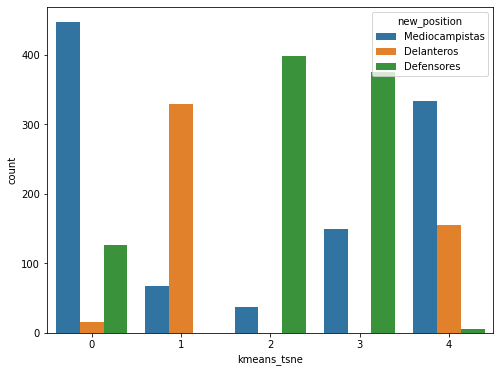

In [62]:
#se grafica las posiciones y se diferencian por clusters
fig = plt.figure(figsize=(8,6))
sns.countplot(df_tsne['kmeans_tsne'], hue=df_tsne['new_position'] )

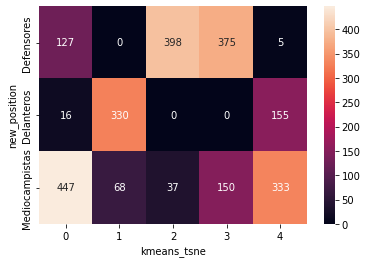

In [63]:
sns.heatmap(pd.crosstab(df_tsne['new_position'],df_tsne['kmeans_tsne']),annot=True,fmt='g')

No se observan grandes diferencias entre la relación observada entre los cluster encontrados y las posiciones, con KMEAN reduciendo o sin reducir la dimensionalidad, ya que se obtienen resultados similares.

#### 6-2- MEAN SHIFT

In [64]:
# Estimacion bandwith
estimate_bandwidth(X_tsne)

31.36003888478027

In [65]:
ms = MeanShift(bandwidth=30) 

ms.fit(X_tsne)

clusters2_tsne = ms.labels_
cluster_centers = ms.cluster_centers_

labels_unique = np.unique(clusters2_tsne)
n_clusters_ = len(labels_unique)

print("Cantidad de clusters encontrados por Mean Shift : %d" % n_clusters_)

Cantidad de clusters encontrados por Mean Shift : 2


In [66]:
MeanShift_clusters = go.Scatter(x= X_tsne[:,0], y=X_tsne[:,1],
                           mode='markers',
                        text=df_tsne.loc[:,'new_position'],
                           marker=dict(
                                size=5,
                                color = clusters2_tsne.astype(np.float), 
                                colorscale='cividis',
                                showscale=False)
                           )


layout_3= go.Layout(title="Mean Shift - tSNE",titlefont=dict(size=20),
                xaxis=dict(title='Componente 1'),
                yaxis=dict(title='Componente 2'),
                autosize=False, width=1000,height=650)

fig62 = go.Figure(data=MeanShift_clusters, layout=layout_3)
fig62.show(renderer="colab")

##### Análisis de clusters

In [67]:
df_tsne['MeanS_tSNE'] = ms.labels_
df_tsne.MeanS_tSNE.value_counts()

0    1510
1     931
Name: MeanS_tSNE, dtype: int64

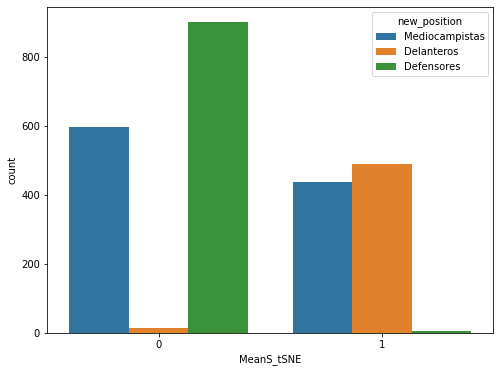

In [68]:
#se grafica las posiciones y se diferencian por clusters
fig = plt.figure(figsize=(8,6))
sns.countplot(df_tsne['MeanS_tSNE'], hue=df_tsne['new_position'] )

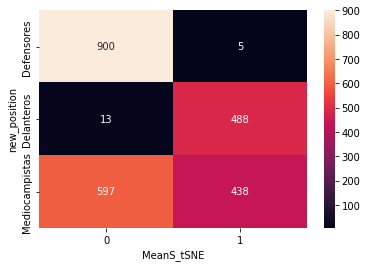

In [69]:
sns.heatmap(pd.crosstab(df_tsne['new_position'],df_tsne['MeanS_tSNE']),annot=True,fmt='g')

MeanShift encuentra en este caso dos agrupamientos, uno compuesto por defensores y mediocampistas, el otro por delanteros y mediocampistas. 

#### 6-3- ALGORITMO JERÁRQUICO

In [70]:
from sklearn import cluster

jerarquico= cluster.AgglomerativeClustering(n_clusters=3, linkage='complete', affinity='cityblock')

jerarquico.fit(X_tsne)

clusters3_tsne = jerarquico.labels_

In [71]:
jerarquico_clusters = go.Scatter(x= X_tsne[:,0], y=X_tsne[:,1],
                           mode='markers',
                        text=df_tsne.loc[:,'new_position'],
                           marker=dict(
                                size=5,
                                color = clusters3_tsne.astype(np.float), 
                                colorscale='inferno',
                                showscale=False))

layout_6 = go.Layout(title="Clustering jerárquico tSNE",titlefont=dict(size=20),
                xaxis=dict(title='Componente 1'),
                yaxis=dict(title='Componente 2'),
                autosize=False, width=1000,height=650)

fig6 = go.Figure(data=jerarquico_clusters, layout=layout_6)
fig6.show(renderer="colab")

##### Análisis de clusters

In [72]:
df_tsne['jerarquico_tSNE'] =jerarquico.labels_
df_tsne.jerarquico_tSNE.value_counts()

0    922
2    825
1    694
Name: jerarquico_tSNE, dtype: int64

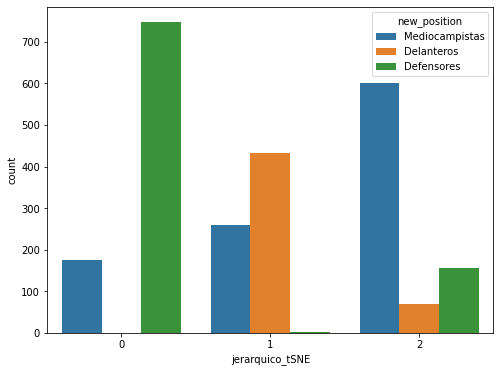

In [73]:
#se grafica las posiciones y se diferencian por clusters
fig = plt.figure(figsize=(8,6))
sns.countplot(df_tsne['jerarquico_tSNE'], hue=df_tsne['new_position'] )

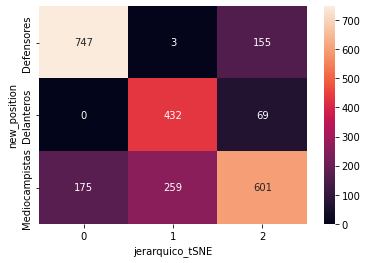

In [74]:
sns.heatmap(pd.crosstab(df_tsne['new_position'],df_tsne['jerarquico_tSNE']),annot=True,fmt='g')

#### 6-4- Comparacion agrupamientos tSNE

Metodo Agrupamiento:  kmeans_tsne
Para n_clusters = 5 El silhouette_score promedio es : 0.39275004234427086
Cluster 0 : 590
Cluster 1 : 398
Cluster 2 : 435
Cluster 3 : 525
Cluster 4 : 493


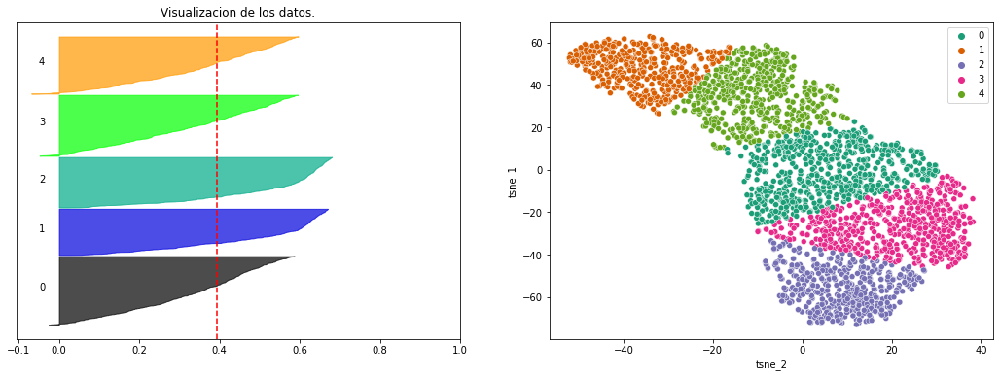

Metodo Agrupamiento:  MeanS_tSNE
Para n_clusters = 2 El silhouette_score promedio es : 0.5676289847786246
Cluster 0 : 1510
Cluster 1 : 931


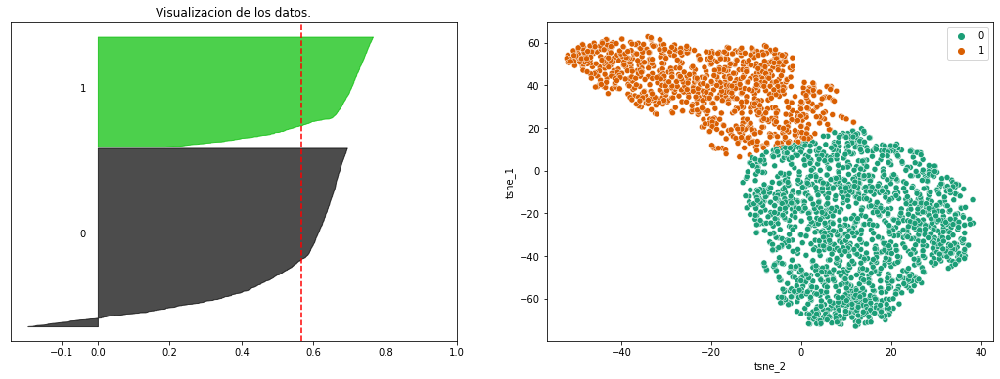

Metodo Agrupamiento:  jerarquico_tSNE
Para n_clusters = 3 El silhouette_score promedio es : 0.4477172425923021
Cluster 0 : 922
Cluster 1 : 694
Cluster 2 : 825


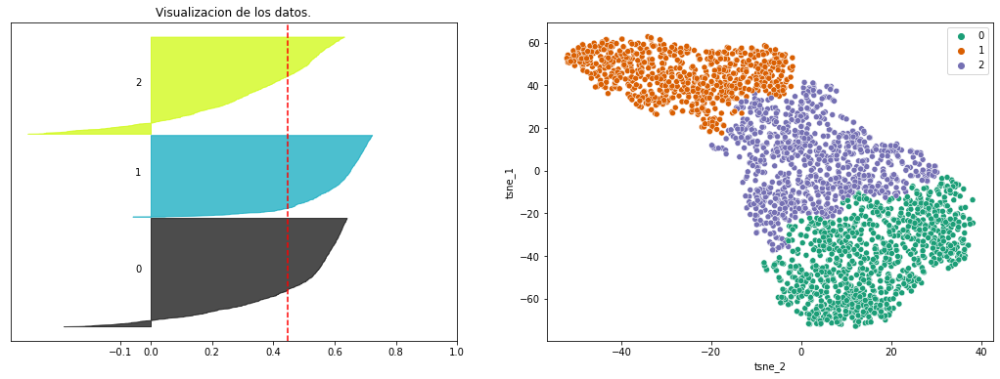

In [75]:
for i in ['kmeans_tsne', 'MeanS_tSNE', 'jerarquico_tSNE']:  
  silhouette_coef (df_tsne[['tsne_1', 'tsne_2']],df_tsne[i].values,i,'tsne_1','tsne_2')

El mayor coeficiente de silhouette se obtiene con MeanShift, que agrupa a los jugadores en 2 clusters.

## 7- Principal Component Analysis (PCA)

In [76]:
# Frames a utilizar
df_pca= df_position.copy()
df_pca.shape , df_n.shape

((2441, 107), (2441, 28))

In [77]:
# Se escalan los datos previo a PCA

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler() 

x_scaled = scaler.fit_transform(df_n)

# df_e = pd.DataFrame(x_scaled, columns=column_names_to_normalize, index = df_i.index).round(3)
# df_i[column_names_to_normalize] = df_e

In [78]:
pca=decomposition.PCA(n_components=4)

pca.fit(x_scaled)

print('proporción de varianza por componente: ', pca.explained_variance_ratio_)

print ('proporción de varianza por componente acumulada: ', pca.explained_variance_ratio_.cumsum())

X_projected=pca.transform(x_scaled) 

print ('tamaño de los datos: ', X_projected.shape)


proporción de varianza por componente:  [0.41671552 0.14548482 0.11079231 0.06663965]
proporción de varianza por componente acumulada:  [0.41671552 0.56220034 0.67299265 0.7396323 ]
tamaño de los datos:  (2441, 4)


In [79]:
data=[]
pcs=pca.components_  

for i, (x,y) in enumerate(zip(pcs[0,:],pcs[1,:])):
    graph=go.Scatter(x=[0,x],y=[0,y],text=df_n.columns[i],
                     mode='lines+markers+text',textposition='middle right',
                     textfont=dict(family='sans serif',size=10))
    data.append(graph)
    
    

layout_11 = go.Layout(title="ACP - Fifa Skills",titlefont=dict(size=20),
            xaxis=dict(title='Componente 1'),
            yaxis=dict(title='Componente 2'),
            autosize=False, width=750,height=500,
            showlegend=False)

fig11 = go.Figure(data=data, layout=layout_11)
fig11.show(renderer="colab")

En la visualizacion observamos cuales son las contribuciones de los atributos a las dos primeras componentes obtenidas con PCA.

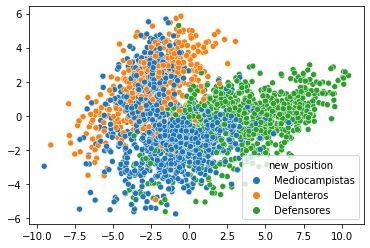

In [80]:
sns.scatterplot(x=X_projected[:,0],y=X_projected[:,1],hue=df_pca['new_position'])

### Agrupamientos sobre PCA

#### 7-1- Kmeans

In [81]:
X_projected.shape

(2441, 4)

Text(0.5, 1.0, 'Inertia of k-Means versus number of clusters')

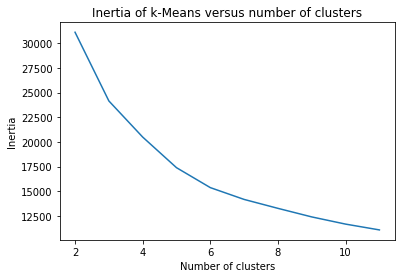

In [82]:
# Se emplea el método del codo para determinar el número de clusters más adecuado 

scores = [KMeans(n_clusters=i).fit(X_projected).inertia_ for i in range(2,12)]

plt.plot(np.arange(2, 12), scores)
plt.xlabel('Number of clusters')
plt.ylabel("Inertia")
plt.title("Inertia of k-Means versus number of clusters")

In [83]:
# Se determina el número más adecuado de clusters
n_clust = 4

km = KMeans(n_clusters=n_clust, random_state=1)
km.fit(X_projected) 

clusters_pca = km.labels_

In [84]:
kmean_clusters_1 = go.Scatter(x= X_projected[:,0], y=X_projected[:,1],
                           mode='markers',
                        text=df_pca.loc[:,'new_position'],
                           marker=dict(
                                size=5,
                                color = clusters_pca.astype(np.float), 
                                colorscale='cividis',
                                showscale=False))


layout_1 = go.Layout(title="Clustering K means - PCA ",titlefont=dict(size=20),
                xaxis=dict(title='Componente 1'),
                yaxis=dict(title='Componente 2'),
                autosize=False, width=800,height=650)

fig71 = go.Figure(data=kmean_clusters_1, layout=layout_1)
fig71.show(renderer="colab")

##### Análisis de clusters

In [85]:
df_pca['kmeans_pca'] = km.labels_ 
df_pca.kmeans_pca.value_counts()

1    738
0    682
3    603
2    418
Name: kmeans_pca, dtype: int64

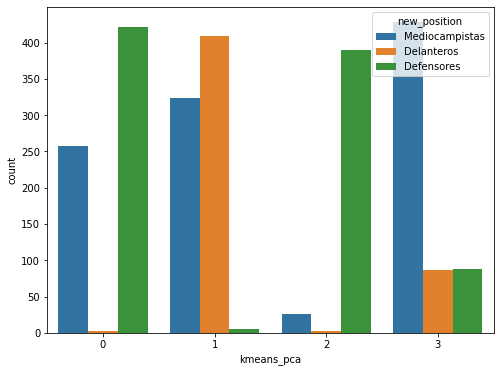

In [86]:
#se grafica las posiciones y se diferencian por clusters
fig = plt.figure(figsize=(8,6))
sns.countplot(df_pca['kmeans_pca'], hue=df_pca['new_position'] )

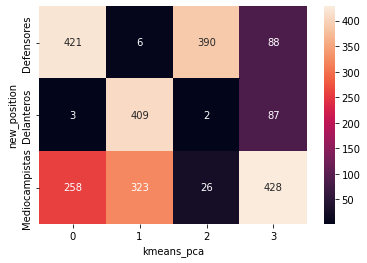

In [87]:
sns.heatmap(pd.crosstab(df_pca['new_position'],df_pca['kmeans_pca']),annot=True,fmt='g')

#### 7-2- Mean Shift

In [88]:
# Estimacion bandwith
estimate_bandwidth(X_projected)

4.624161308352983

Con el bandwith estimado MeanShift encuentra solo 1 cluster, lo disminuimos para forzar clusters

In [89]:
ms = MeanShift(bandwidth=2.7) 

ms.fit(X_projected)

clusters2_pca = ms.labels_
cluster_centers = ms.cluster_centers_

labels_unique = np.unique(clusters2_pca)
n_clusters_ = len(labels_unique)

print("Cantidad de clusters encontrados por Mean Shift : %d" % n_clusters_)

Cantidad de clusters encontrados por Mean Shift : 3


In [90]:
MeanShift_clusters = go.Scatter(x= X_projected[:,0], y=X_projected[:,1],
                           mode='markers',
                        text=df_pca.loc[:,'new_position'],
                           marker=dict(
                                size=5,
                                color = clusters2_pca.astype(np.float), 
                                colorscale='cividis',
                                showscale=False)
                           )


layout_3= go.Layout(title="Mean Shift - PCA",titlefont=dict(size=20),
                xaxis=dict(title='Componente 1'),
                yaxis=dict(title='Componente 2'),
                autosize=False, width=1000,height=650)

fig72 = go.Figure(data=MeanShift_clusters, layout=layout_3)
fig72.show(renderer="colab")

##### Análisis de clusters

In [91]:
df_pca['MeanS_pca'] = ms.labels_
df_pca.MeanS_pca.value_counts()

0    1371
1    1006
2      64
Name: MeanS_pca, dtype: int64

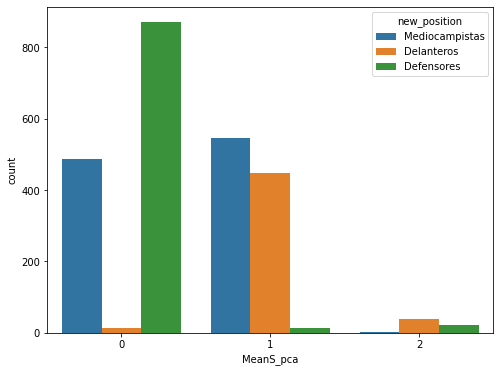

In [92]:
#se grafica las posiciones y se diferencian por clusters
fig = plt.figure(figsize=(8,6))
sns.countplot(df_pca['MeanS_pca'], hue=df_pca['new_position'] )

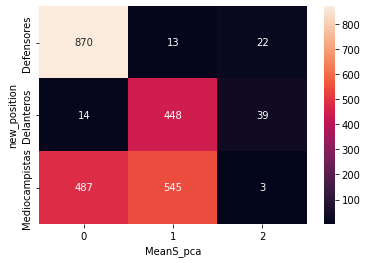

In [93]:
sns.heatmap(pd.crosstab(df_pca['new_position'],df_pca['MeanS_pca']),annot=True,fmt='g')

MeanShift encuentra en este caso dos agrupamientos, uno compuesto por defensores y mediocampistas, el otro por delanteros y mediocampistas. 

#### 7-3- Algoritmo Jeràrquico

In [94]:
from sklearn import cluster

jerarquico= cluster.AgglomerativeClustering(n_clusters=5, linkage='complete', affinity='cityblock')

jerarquico.fit(X_projected)

clusters3_pca = jerarquico.labels_

In [95]:
jerarquico_clusters = go.Scatter(x= X_projected[:,0], y=X_projected[:,1],
                           mode='markers',
                        text=df_pca.loc[:,'new_position'],
                           marker=dict(
                                size=5,
                                color = clusters3_pca.astype(np.float), 
                                colorscale='inferno',
                                showscale=False))

layout_6 = go.Layout(title="Clustering jerárquico PCA",titlefont=dict(size=20),
                xaxis=dict(title='Componente 1'),
                yaxis=dict(title='Componente 2'),
                autosize=False, width=1000,height=650)

fig6 = go.Figure(data=jerarquico_clusters, layout=layout_6)
fig6.show(renderer="colab")

##### Análisis de clusters

In [96]:
df_pca['jerarquico_pca'] =jerarquico.labels_
df_pca.jerarquico_pca.value_counts()

2    1026
3     646
0     391
1     298
4      80
Name: jerarquico_pca, dtype: int64

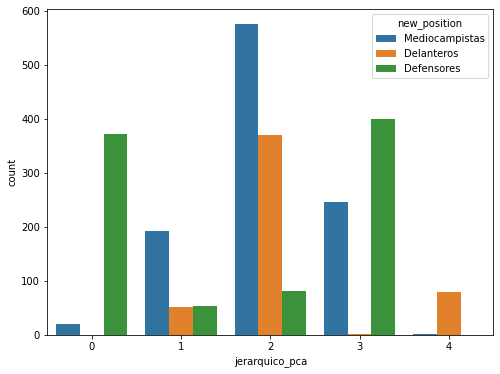

In [97]:
#se grafica las posiciones y se diferencian por clusters
fig = plt.figure(figsize=(8,6))
sns.countplot(df_pca['jerarquico_pca'], hue=df_pca['new_position'] )

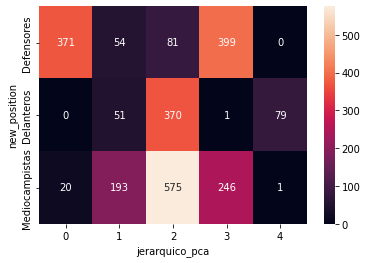

In [98]:
sns.heatmap(pd.crosstab(df_pca['new_position'],df_pca['jerarquico_pca']),annot=True,fmt='g')

#### 7-4- Comparacion agrupamientos PCA

In [99]:
df_pca.head(2)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club_name,league_name,league_rank,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,new_position,kmeans_pca,MeanS_pca,jerarquico_pca
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,33,1987-06-24,170,72,Argentina,FC Barcelona,Spain Primera Division,1.0,93,93,67500000,560000,"RW, ST, CF",Left,5,4,4,Medium/Low,Messi,Yes,138400000.0,"#Dribbler, #Distance Shooter, #FK Specialist, ...",CAM,10.0,NaN,2004-07-01,2021.0,RW,10.0,85.0,92.0,91.0,95.0,38.0,65.0,NaN,NaN,NaN,NaN,NaN,NaN,"Finesse Shot, Long Shot Taker (AI), Speed Drib...",85,95,70,91,88,96,93,94,91,96,91,80,91,94,95,86,68,72,69,94,44,40,93,95,75,96,NaN,35,24,6,11,15,14,8,89+3,89+3,89+3,92+0,93+0,93+0,93+0,92+0,93+0,93+0,93+0,91+2,87+3,87+3,87+3,91+2,66+3,65+3,65+3,65+3,66+3,62+3,52+3,52+3,52+3,62+3,Mediocampistas,3,1,1
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,35,1985-02-05,187,83,Portugal,Juventus,Italian Serie A,1.0,92,92,46000000,220000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,75900000.0,"#Aerial Threat, #Dribbler, #Distance Shooter, ...",LS,7.0,NaN,2018-07-10,2022.0,LS,7.0,89.0,93.0,81.0,89.0,35.0,77.0,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Flair, Long Shot Taker (AI), ...",84,95,90,82,86,88,81,76,77,92,87,91,87,95,71,94,95,84,78,93,63,29,95,82,84,95,NaN,32,24,7,11,15,14,11,91+1,91+1,91+1,89+0,91+0,91+0,91+0,89+0,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,54+3,54+3,54+3,61+3,Delanteros,3,1,1


Metodo Agrupamiento:  kmeans_pca
Para n_clusters = 4 El silhouette_score promedio es : 0.26450860118985664
Cluster 0 : 682
Cluster 1 : 738
Cluster 2 : 418
Cluster 3 : 603


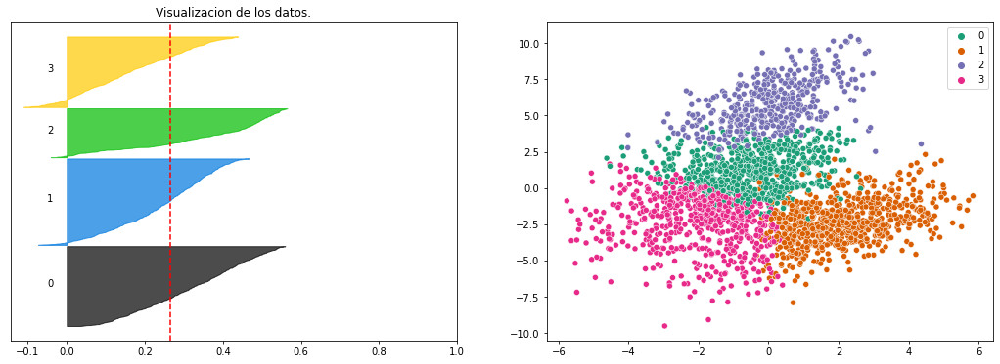

Metodo Agrupamiento:  MeanS_pca
Para n_clusters = 3 El silhouette_score promedio es : 0.25452713480405764
Cluster 0 : 1371
Cluster 1 : 1006
Cluster 2 : 64


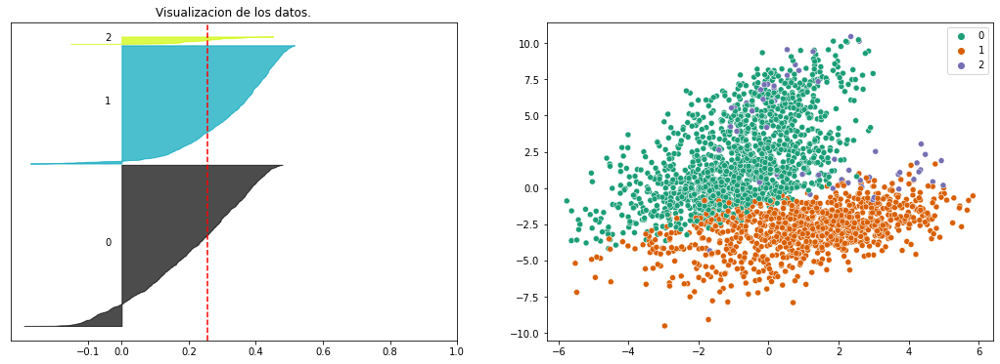

Metodo Agrupamiento:  jerarquico_pca
Para n_clusters = 5 El silhouette_score promedio es : 0.15934276353151747
Cluster 0 : 391
Cluster 1 : 298
Cluster 2 : 1026
Cluster 3 : 646
Cluster 4 : 80


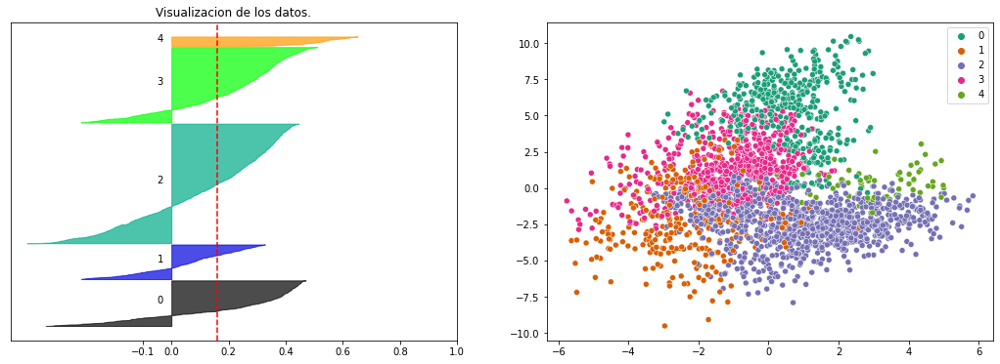

In [100]:
for i in ['kmeans_pca', 'MeanS_pca', 'jerarquico_pca']:  
  silhouette_coef (X_projected,df_pca[i].values,i,X_projected[:,0],X_projected[:,1])

El mayor coeficiente de silhouette se obtiene con MeanShift, que agrupa a los jugadores en 2 clusters.

## Conclusión

Comparando los diferentes clusters realizados sobre los atributos de los jugadores, con la posicion que ocupan en el campo, se podria concluir que se logra diferenciar las caracteristicas que distinguen a delanteros de defensores, mientras que las caracteristicas de algunos mediocampistas se aproximan más a delanteros y la de otros màs a caracteristicas propias de defensores.

### ¿Se realizó alguna normalización de la base? ¿Por qué?

Se estandarizó la base, con standard scaler, para aplicar PCA, no fue necesario realizarlo para los metodos de agrupamiento ya que el rango de valores de las skills se encuentra entre 0 y 100.